* Look at data-new model results comparison in fall, 2014.

In [1]:
from __future__ import division
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import ACTDR
import netCDF4 as nc
import glob
import os
from salishsea_tools import viz_tools
from dateutil import tz
import matplotlib.dates as mdates
import numpy as np
import datetime
from salishsea_tools import (tidetools, nc_tools)
from salishsea_tools.nowcast import figures
from salishsea_tools.nowcast import analyze
import sys
sys.path.append('/ocean/jieliu/research/meopar/analysis/Nancy/strat/comparisons/')
import comparisons
%matplotlib inline

In [2]:
sns.set_style('darkgrid')

In [3]:
paths = {'nowcast': '/results/SalishSea/nowcast/',
         'RFdaily': '/data/jieliu/MEOPAR/IOS/octRFdaily/',
         '1e-05': '/data/jieliu/MEOPAR/IOS/oct1e05/',
          '1e-051e-06':'/data/jieliu/MEOPAR/IOS/oct1e061e05/'}
FIRST_NOWCAST = datetime.datetime(2014, 10, 27)

In [4]:
ACTDR.load_dat('SOG_2000.dat')

('> open ', 'SOG_2000.dat')
> load CTD_DAT
> load STANDARD_KEYS
('> close ', 'SOG_2000.dat')
> complete


In [5]:
data = pd.DataFrame(ACTDR.CTD_DAT)

In [6]:
data_fall = data[(data.Year>=2014) & (data.Month >=10) ]

# Compare daily result 

In [7]:
model_year = 2014
lon_min=-124
lon_max=-123
lat_min=48.7
lat_max=49.3
zmax = 20
data_SOG  = comparisons.isolate_region(data_fall,lon_min, lon_max, lat_min, lat_max)

In [8]:
def get_early_filename(t_orig, period, grid, results_dir):
    """t_orig is within the period of the file"""
    early_dir = os.path.join(results_dir, 'early-days')
    allfiles = glob.glob(
        os.path.join(early_dir,
                     '*/SalishSea_{}*_{}.nc'.format(period, grid)))

    files = []
    for filename in allfiles:
        base = os.path.basename(filename).split('_')
        if base[2] <= t_orig.strftime('%Y%m%d'):
            if base[3] >= t_orig.strftime('%Y%m%d'):
                files.append(filename)

    files.sort(key=os.path.basename)

    return files[0]

In [9]:
def load_model(model_path, start_date, end_date, field):
    """Loads model grid_T data in date range defined by start_date and end_date
    Only considers daily averaged model fields.
    Returns model depths, variable defined by field, and dates associated with
    variable
    """

    files = analyze.get_filenames(start_date, end_date,
                                  '1d', 'grid_T', model_path)
    dates = [datetime.datetime(2014, 10, 5),datetime.datetime(2014, 10, 12),\
        datetime.datetime(2014, 10, 19),datetime.datetime(2014, 9, 25),\
        datetime.datetime(2014, 10, 26)]
    if model_path == paths['nowcast']:
        for date in dates:
            files_early = get_early_filename(date, '1d', 'grid_T', paths['nowcast'])
            files.append(files_early)
    var, dates = analyze.combine_files(files, field, np.arange(0, 40),
                                           np.arange(0, 898),
                                           np.arange(0, 398))
    tmp = nc.Dataset(files[0])
    depth = tmp.variables['deptht'][:]
    
    return depth, var, dates

In [10]:
def compare_model_obs(month, model_year, field, data_obs, model_path,
                      xmin=-124, xmax=-122, ymin=48, ymax=50,
                      zmin=0, zmax=300, vmin=10, vmax=32):
    grid = '/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc'
    f = nc.Dataset(grid)
    bathy = f.variables['Bathymetry'][:]
    X = f.variables['nav_lon'][:]
    Y = f.variables['nav_lat'][:]

    fig, [ax, axm] = plt.subplots(1, 2, figsize=(10, 3))

    # date ranges based on month and model_year
    sdt = datetime.datetime(model_year, month, 1)
    edt = sdt + datetime.timedelta(days=31)

    # Model variables and nowcast/spinup?
    if field == 'Salinity':
        model_field = 'vosaline'
    elif field == 'Temperatute':
        model_field = 'votemper'
    # To compare with various results?
    if model_path == paths['RFdaily'] :
        title = 'RFNewResult'
    elif model_path ==paths['1e-05']:
        title ='ReduceViscosity'
    elif model_path ==paths['1e-051e-06']:
        title = 'AllReduce'
    elif model_path ==paths['nowcast']:
        title = 'Nowcast'

    # load model variables
    depth_mod, var_mod, dates_mod = load_model(model_path, sdt, edt,
                                               model_field)

    # plot obs and model
    data_m = data_obs[data_obs['Month'] == month]
    for dep_obs, var_obs, lon, lat, day in zip(data_m['Depth'],
                                               data_m[field],
                                               data_m['Longitude'],
                                               data_m['Latitude'],
                                               data_m['Day']):
        # model grid points
        [j, i] = tidetools.find_closest_model_point(lon, lat, X, Y, bathy)
        # model time index
        t_ind = []
        for count, date in enumerate(dates_mod):
            if date.month == month:
                if date.day == day:
                    t_ind = count
        var_plot = var_mod[t_ind, :, j, i]
        var_plot = np.ma.masked_values(var_plot, 0)

        ax.plot(var_obs, dep_obs, '-*r', label='obs', alpha=0.5)
        if j:
            try:
                ax.plot(var_plot, depth_mod, '-ob', label='model', alpha=0.5)
            except ValueError:
                print ('No model data for {}/{}'.format(day, month))
        # plot location on map
        axm.plot(lon, lat, '*r')

    # Set plot axis and labels
    ax.set_ylim([zmax, zmin])
    ax.set_xlim([vmin, vmax])
    ax.set_title(title)
    ax.set_ylabel('Depth [m]')
    ax.set_xlabel(field)

    # plot mode coastline
    viz_tools.plot_coastline(axm, f, coords='map')
    axm.set_ylim([ymin, ymax])
    axm.set_xlim([xmin, xmax])
    axm.set_title('Month {}'.format(month))

    # fake the legend
    simObs, = ax.plot(-1, 0, 'r*')
    simMod, = ax.plot(-1, 0, 'bo')
    ax.legend([simObs, simMod], ['obs', 'model'], loc=0)

    return fig

/ocean/jieliu/research/meopar/tools/SalishSeaTools/salishsea_tools/nowcast/analyze.py:169: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if kss == 'None':
/home/jieliu/anaconda3/envs/mypython2/lib/python2.7/site-packages/matplotlib/collections.py:650: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors_original != str('face'):


No model data for 1/10
No model data for 1/10
No model data for 2/10
No model data for 2/10
No model data for 3/10
No model data for 3/10
No model data for 2/10
No model data for 3/10


/home/jieliu/anaconda3/envs/mypython2/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


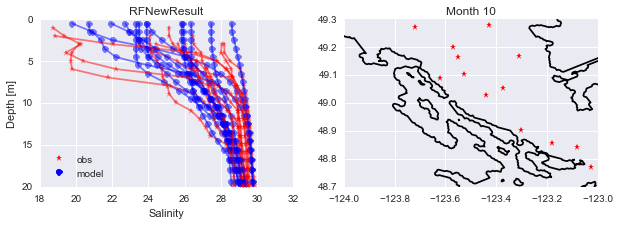

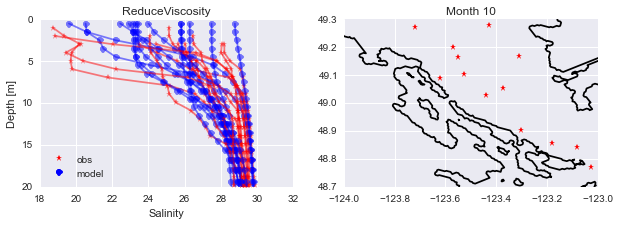

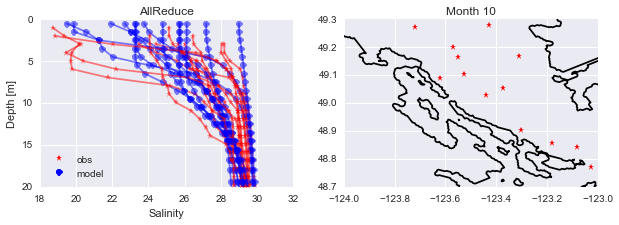

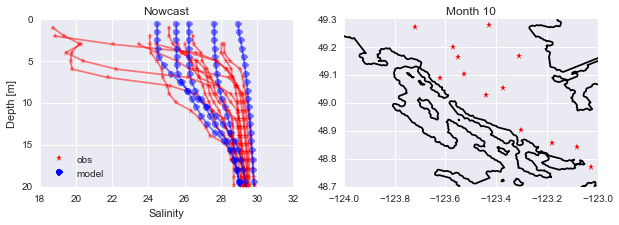

In [11]:
month=10
fig = compare_model_obs(month, model_year, 'Salinity',data_SOG,paths['RFdaily'],\
                       zmax=zmax,vmin=18,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOG,paths['1e-05'],\
                       zmax=zmax,vmin=18,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOG,paths['1e-051e-06'],\
                       zmax=zmax,vmin=18,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOG,paths['nowcast'],\
                       zmax=zmax,vmin=18,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

# Compare hourly result for each cast in central strait

In [13]:
def compare_cast_hourly(month, model_year, field, data_obs, model_path,
                        name,xmin=-124, xmax=-122, ymin=48, ymax=50, zmin=0,
                        zmax=300, vmin=10, vmax=32):
    """Comparison between model and observations at every cast in a given month
    Model daily average is compared witth houlry std errors
    """
    # Load model grid
    grid = '/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea6.nc'
    f = nc.Dataset(grid)
    bathy = f.variables['Bathymetry'][:]
    X = f.variables['nav_lon'][:]
    Y = f.variables['nav_lat'][:]
    mesh = '/data/nsoontie/MEOPAR/NEMO-forcing/grid/mesh_mask_SalishSea2.nc'
    g = nc.Dataset(mesh)
    depth_mod = g.variables['gdept_0'][0, :]

    # Model variables
    if field == 'Salinity':
        model_field = 'vosaline'
    elif field == 'Temperature':
        model_field = 'votemper'

    # plot obs and model
    data_m = data_obs[data_obs['Month'] == month]
    num_casts = len(data_m.index)
    fig, axs = plt.subplots(num_casts, 2, figsize=(15, 4.5*num_casts))
    cast = 0
    for dep_obs, var_obs, lon, lat, day, year in zip(data_m['Depth'],
                                                     data_m[field],
                                                     data_m['Longitude'],
                                                     data_m['Latitude'],
                                                     data_m['Day'],
                                                     data_m['Year']):
        # model grid points
        try:
            ax = axs[cast, 0]
            axm = axs[cast, 1]
        except IndexError:
            ax = axs[0]
            axm = axs[1]
        j, i = tidetools.find_closest_model_point(lon, lat, X, Y, bathy)
        date = datetime.datetime(year, month, day) 
        filename_pattern = '1h_Plume{i}_T.nc'
        if num_casts ==13:
            path = os.path.join(model_path, filename_pattern.format( i = cast+1))
        elif num_casts ==26:
            path = os.path.join(model_path, filename_pattern.format( i = cast+14)) 
        ## for new result
        new_file = nc.Dataset(path);
        sal = new_file.variables['vosaline']
        sal = np.ma.masked_values(sal, 0)
        min_h_new = np.min(sal[(day-1)*24:day*24,:,0,0], axis=0)
        max_h_new = np.max(sal[(day-1)*24:day*24,:,0,0], axis=0)
        var_plot_new = np.mean(sal[(day-1)*24:day*24,:,0,0], axis=0)
        ## for nowcast
        if date >= FIRST_NOWCAST:
            hourly_grid = comparisons.get_hourly_grid(date, paths['nowcast'])
            depth_mod = hourly_grid.variables['deptht'][:]
            max_h, min_h, var_plot = comparisons.calculate_hourly_ext(model_field,
                                                          hourly_grid, j, i)
        else:
            var_model = comparisons.early_model_data(date, j, i, '1h',
                                         'grid_T', model_field, paths['nowcast'])
            var_plot = np.mean(var_model, axis=0)
            min_h = np.min(var_model, axis=0)
            max_h = np.max(var_model, axis=0)

        # plot new model results
        ax.plot(var_plot_new, depth_mod, '-g', linewidth = 3,
                label='daily mean new', alpha=0.5)
        ax.plot(max_h_new, depth_mod, 'c--', linewidth = 3,label='daily max new')
        ax.plot(min_h_new, depth_mod, 'c:', linewidth = 3,label='daily min new')
        # plot nowcast model results
        ax.plot(var_plot, depth_mod, '-b',linewidth = 3,
                label='daily mean nowcast', alpha=0.5)
        ax.plot(max_h, depth_mod, 'k--', linewidth = 3,label='daily max nowcast')
        ax.plot(min_h, depth_mod, 'k:', linewidth = 3,label='daily min nowcast')
        # plot observations and location on map
        ax.plot(var_obs, dep_obs, '-*r',linewidth = 3, label='obs')
        axm.plot(lon, lat, '*r')
        # Set plot axis and labels
        ax.set_ylim([zmax, zmin])
        ax.set_xlim([vmin, vmax])
        ax.set_ylabel('Depth [m]')
        ax.set_xlabel(field)
        ax.set_title('{} and nowcast'.format(name))
        # plot mode coastline
        viz_tools.plot_coastline(axm, f, coords='map')
        axm.set_ylim([ymin, ymax])
        axm.set_xlim([xmin, xmax])
        axm.set_title('{}-{}-{}'.format(year, month, day))
        # legend
        ax.legend(loc='best', fontsize = 12)
        cast = cast+1

    return fig

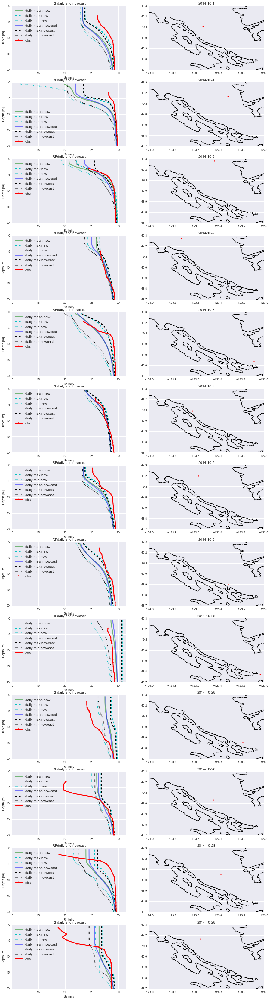

In [14]:
month=10
fig=compare_cast_hourly(month,2014,'Salinity',data_SOG,paths['RFdaily'],'RFdaily',zmax=zmax,vmin=10,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

* RFdaily: slightly better than nowcast.

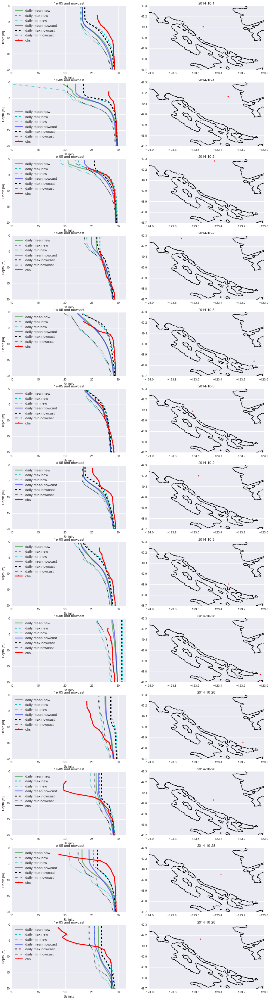

In [15]:
month=10
fig=compare_cast_hourly(month,2014,'Salinity',data_SOG,paths['1e-05'],'1e-05',zmax=zmax,vmin=10,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

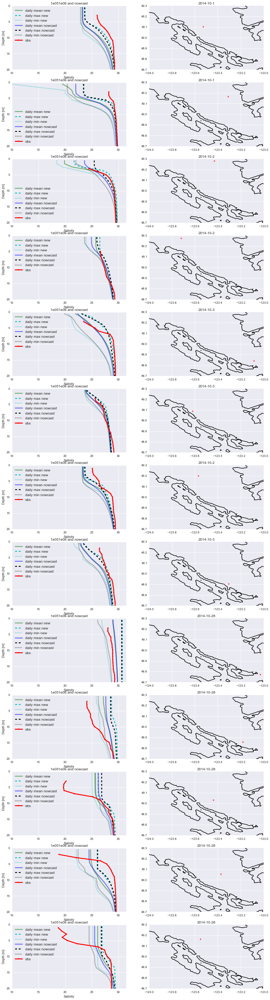

In [16]:
month=10
fig=compare_cast_hourly(month,2014,'Salinity',data_SOG,paths['1e-051e-06'],'1e051e06',zmax=zmax,vmin=10,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

# Compare hourly result for each cast in north strait

In [17]:
lon_min=-125.1
lon_max=-123
lat_min=49.3
lat_max=50
data_SOGN  = comparisons.isolate_region(data_fall,lon_min, lon_max, lat_min, lat_max)

No model data for 1/10
No model data for 1/10
No model data for 2/10


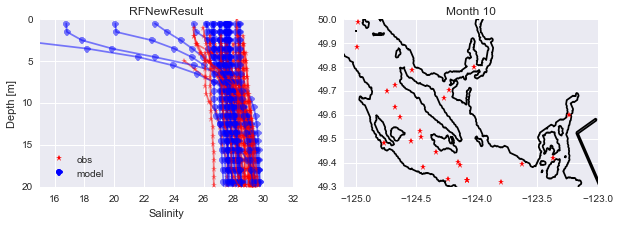

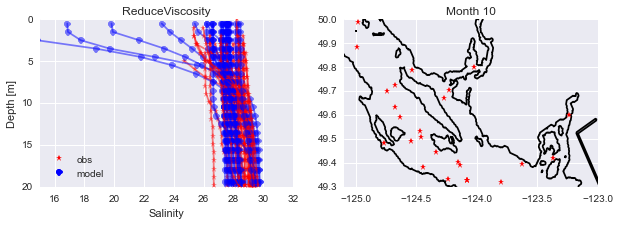

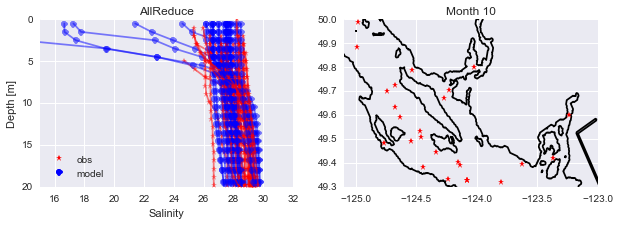

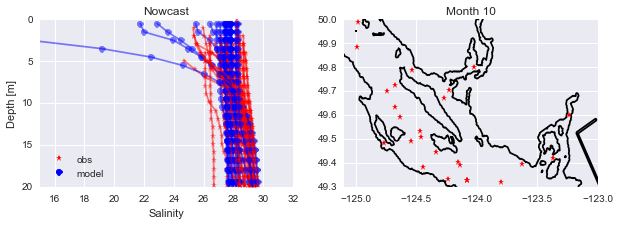

In [18]:
month=10
fig = compare_model_obs(month, model_year, 'Salinity',data_SOGN,paths['RFdaily'],\
                       zmax=zmax,vmin=15,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOGN,paths['1e-05'],\
                       zmax=zmax,vmin=15,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOGN,paths['1e-051e-06'],\
                       zmax=zmax,vmin=15,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)
fig = compare_model_obs(month, model_year, 'Salinity',data_SOGN,paths['nowcast'],\
                       zmax=zmax,vmin=15,vmax=32,xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

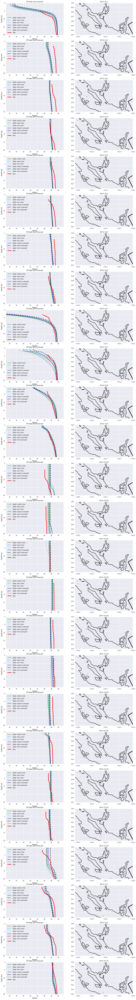

In [19]:
fig=compare_cast_hourly(month,2014,'Salinity',data_SOGN,paths['RFdaily'],'RFdaily',zmax=zmax,vmin=15,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

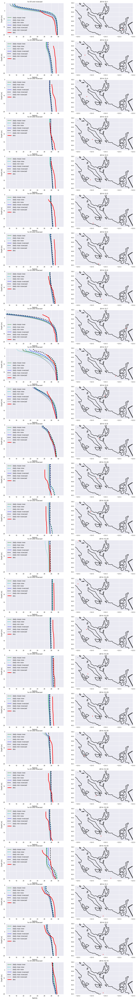

In [20]:
fig=compare_cast_hourly(month,2014,'Salinity',data_SOGN,paths['1e-05'],'1e-05',zmax=zmax,vmin=15,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)

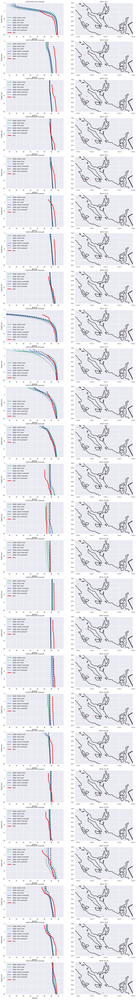

In [21]:
fig=compare_cast_hourly(month,2014,'Salinity',data_SOGN,paths['1e-051e-06'],'1e051e06',zmax=zmax,vmin=15,vmax=31.5,
                                  xmin=lon_min,xmax=lon_max,ymin=lat_min,ymax=lat_max)